# Locale.ai Interview- Data Science Task

## Importing the libraries

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import cm
import seaborn as sns
sns.set(style = "white", palette = "muted", color_codes = True)
import pandas as pd
import numpy as np
from math import *

import folium
from folium import plugins
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap


### Data Description
1. **id** - booking ID
2. **user_id** - the ID of the customer (based on mobile number)
3. **vehicle_model_id** - vehicle model type.
4. **package_id** - type of package (1=4hrs & 40kms, 2=8hrs & 80kms, 3=6hrs & 60kms, 4= 10hrs & 100kms, 5=5hrs & 50kms, 6=3hrs & 30kms, 7=12hrs & 120kms)
5. **travel_type_id** - type of travel (1=long distance, 2= point to point, 3= hourly rental).
6. **from_area_id** - unique identifier of area. Applicable only for point-to-point travel and packages
7. **to_area_id** - unique identifier of area. Applicable only for point-to-point travel
8. **from_city_id** - unique identifier of city
9. **to_city_id** - unique identifier of city (only for intercity)
10. **from_date** - time stamp of requested trip start
11. **to_date** - time stamp of trip end
12. **online_booking** - if booking was done on desktop website
13. **mobile_site_booking** - if booking was done on mobile website
14. **booking_created** - time stamp of booking
15. **from_lat** - latitude of from area
16. **from_long** - longitude of from area
17. **to_lat** - latitude of to area
18. **to_long** - longitude of to area
19. **Car_Cancellation** - whether the booking was cancelled (1) or not (0) due to unavailability of a car.

## Importing the Dataset

In [4]:
df = pd.read_csv('./Data.csv')
df.head()

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,to_date,online_booking,mobile_site_booking,booking_created,from_lat,from_long,to_lat,to_long,Car_Cancellation
0,132512,22177,28,NaN,2,83.0,448.0,NaN,NaN,1/1/2013 2:00,NaN,0,0,1/1/2013 1:39,12.924150,77.672290,12.927320,77.635750,0
1,132513,21413,12,NaN,2,1010.0,540.0,NaN,NaN,1/1/2013 9:00,NaN,0,0,1/1/2013 2:25,12.966910,77.749350,12.927680,77.626640,0
2,132514,22178,12,NaN,2,1301.0,1034.0,NaN,NaN,1/1/2013 3:30,NaN,0,0,1/1/2013 3:08,12.937222,77.626915,13.047926,77.597766,0
3,132515,13034,12,NaN,2,768.0,398.0,NaN,NaN,1/1/2013 5:45,NaN,0,0,1/1/2013 4:39,12.989990,77.553320,12.971430,77.639140,0
4,132517,22180,12,NaN,2,1365.0,849.0,NaN,NaN,1/1/2013 9:00,NaN,0,0,1/1/2013 7:53,12.845653,77.677925,12.954340,77.600720,0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43431 entries, 0 to 43430
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id                   43431 non-null  int64  
 1   user_id              43431 non-null  int64  
 2   vehicle_model_id     43431 non-null  int64  
 3   package_id           7550 non-null   float64
 4   travel_type_id       43431 non-null  int64  
 5   from_area_id         43343 non-null  float64
 6   to_area_id           34293 non-null  float64
 7   from_city_id         16345 non-null  float64
 8   to_city_id           1588 non-null   float64
 9   from_date            43431 non-null  object 
 10  to_date              25541 non-null  object 
 11  online_booking       43431 non-null  int64  
 12  mobile_site_booking  43431 non-null  int64  
 13  booking_created      43431 non-null  object 
 14  from_lat             43338 non-null  float64
 15  from_long            43338 non-null 

In [6]:
df.describe()

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,online_booking,mobile_site_booking,from_lat,from_long,to_lat,to_long,Car_Cancellation
count,43431.000000,43431.000000,43431.00000,7550.000000,43431.000000,43343.000000,34293.000000,16345.000000,1588.000000,43431.000000,43431.000000,43338.000000,43338.000000,34293.000000,34293.000000,43431.000000
mean,159206.473556,30739.198153,25.71723,2.030066,2.137252,714.544494,669.490917,14.915081,68.537783,0.351592,0.043241,12.982461,77.636255,13.026648,77.640595,0.072114
std,15442.386279,10996.476709,26.79825,1.461756,0.437712,419.883553,400.638225,1.165306,49.880732,0.477473,0.203402,0.085933,0.059391,0.113487,0.064045,0.258680
min,132512.000000,16.000000,1.00000,1.000000,1.000000,2.000000,2.000000,1.000000,4.000000,0.000000,0.000000,12.776630,77.386930,12.776630,77.386930,0.000000
25%,145778.000000,24614.000000,12.00000,1.000000,2.000000,393.000000,393.000000,15.000000,32.000000,0.000000,0.000000,12.926450,77.593661,12.951850,77.582030,0.000000
50%,159248.000000,31627.000000,12.00000,2.000000,2.000000,590.000000,541.000000,15.000000,49.000000,0.000000,0.000000,12.968887,77.635750,12.982750,77.645030,0.000000
75%,172578.500000,39167.000000,24.00000,2.000000,2.000000,1089.000000,1054.000000,15.000000,108.000000,1.000000,0.000000,13.007750,77.688900,13.199560,77.706880,0.000000
max,185941.000000,48730.000000,91.00000,7.000000,3.000000,1403.000000,1403.000000,31.000000,203.000000,1.000000,1.000000,13.366072,77.786420,13.366072,77.786420,1.000000


## Finding out the null (NaN) values in each column

In [8]:
df.isnull().sum()

id                         0
user_id                    0
vehicle_model_id           0
package_id             35881
travel_type_id             0
from_area_id              88
to_area_id              9138
from_city_id           27086
to_city_id             41843
from_date                  0
to_date                17890
online_booking             0
mobile_site_booking        0
booking_created            0
from_lat                  93
from_long                 93
to_lat                  9138
to_long                 9138
Car_Cancellation           0
dtype: int64

## Finding out the percentage of missing values in each column in the given dataset

In [9]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'percent_missing': percent_missing})
missing_value_df

,percent_missing
id,0.000000
user_id,0.000000
vehicle_model_id,0.000000
package_id,82.616104
travel_type_id,0.000000
from_area_id,0.202620
to_area_id,21.040271
from_city_id,62.365591
to_city_id,96.343626
from_date,0.000000


In [10]:
list(df.select_dtypes(['object']).columns)

['from_date', 'to_date', 'booking_created']

## Converting from_date, to_date, and booking_created columns into datetime dtype

In [11]:
df['from_date'] = df['from_date'].astype('datetime64[ns]')
df['to_date'] = df['to_date'].astype('datetime64[ns]')
df['booking_created'] = df['booking_created'].astype('datetime64[ns]')

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43431 entries, 0 to 43430
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   id                   43431 non-null  int64         
 1   user_id              43431 non-null  int64         
 2   vehicle_model_id     43431 non-null  int64         
 3   package_id           7550 non-null   float64       
 4   travel_type_id       43431 non-null  int64         
 5   from_area_id         43343 non-null  float64       
 6   to_area_id           34293 non-null  float64       
 7   from_city_id         16345 non-null  float64       
 8   to_city_id           1588 non-null   float64       
 9   from_date            43431 non-null  datetime64[ns]
 10  to_date              25541 non-null  datetime64[ns]
 11  online_booking       43431 non-null  int64         
 12  mobile_site_booking  43431 non-null  int64         
 13  booking_created      43431 non-

In [13]:
df.head(3)

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,to_date,online_booking,mobile_site_booking,booking_created,from_lat,from_long,to_lat,to_long,Car_Cancellation
0,132512,22177,28,NaN,2,83.0,448.0,NaN,NaN,2013-01-01 02:00:00,NaT,0,0,2013-01-01 01:39:00,12.924150,77.672290,12.927320,77.635750,0
1,132513,21413,12,NaN,2,1010.0,540.0,NaN,NaN,2013-01-01 09:00:00,NaT,0,0,2013-01-01 02:25:00,12.966910,77.749350,12.927680,77.626640,0
2,132514,22178,12,NaN,2,1301.0,1034.0,NaN,NaN,2013-01-01 03:30:00,NaT,0,0,2013-01-01 03:08:00,12.937222,77.626915,13.047926,77.597766,0


## Exploratory Data Analysis (EDA)

In [14]:
from datetime import datetime as dt
df['day_of_week'] = df.from_date.dt.dayofweek

In [15]:
df.head()

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,to_date,online_booking,mobile_site_booking,booking_created,from_lat,from_long,to_lat,to_long,Car_Cancellation,day_of_week
0,132512,22177,28,NaN,2,83.0,448.0,NaN,NaN,2013-01-01 02:00:00,NaT,0,0,2013-01-01 01:39:00,12.924150,77.672290,12.927320,77.635750,0,1
1,132513,21413,12,NaN,2,1010.0,540.0,NaN,NaN,2013-01-01 09:00:00,NaT,0,0,2013-01-01 02:25:00,12.966910,77.749350,12.927680,77.626640,0,1
2,132514,22178,12,NaN,2,1301.0,1034.0,NaN,NaN,2013-01-01 03:30:00,NaT,0,0,2013-01-01 03:08:00,12.937222,77.626915,13.047926,77.597766,0,1
3,132515,13034,12,NaN,2,768.0,398.0,NaN,NaN,2013-01-01 05:45:00,NaT,0,0,2013-01-01 04:39:00,12.989990,77.553320,12.971430,77.639140,0,1
4,132517,22180,12,NaN,2,1365.0,849.0,NaN,NaN,2013-01-01 09:00:00,NaT,0,0,2013-01-01 07:53:00,12.845653,77.677925,12.954340,77.600720,0,1


In [16]:
df.day_of_week.unique()

array([1, 2, 5, 3, 4, 0, 6])

## Let's replace these unique numbers to name of the day in a week

In [17]:
df['day_of_week'] = df.day_of_week.replace([0, 1, 2, 3, 4, 5, 6], ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

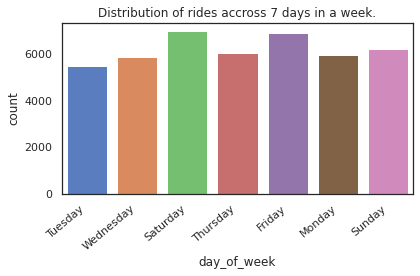

In [20]:
ax = sns.countplot(df['day_of_week'])
plt.title("Distribution of rides accross 7 days in a week.")

ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

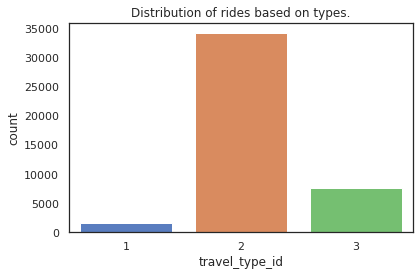

In [24]:
ax = sns.countplot(df['travel_type_id'])
plt.title("Distribution of rides based on types.")

plt.tight_layout()
plt.show()

## joint plot

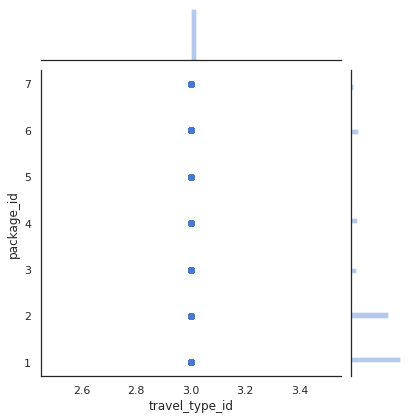

In [21]:
sns.jointplot(x = 'travel_type_id', y = 'package_id', data = df, kind = 'scatter')

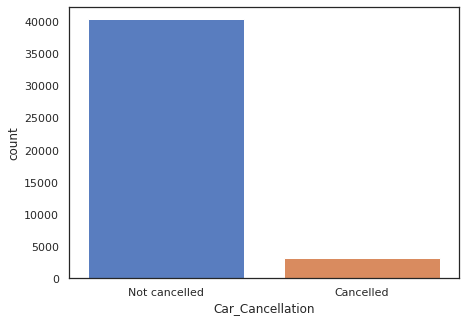

In [120]:
plt.figure(figsize=(7, 5))
cplot = sns.countplot(x='Car_Cancellation',data=df)
cplot.set_xticklabels(('Not cancelled', 'Cancelled'))
for p in ax.patches:
    percentage = '{:.1f}%'
    ax.annotate(percentage, (x, y),ha='center')

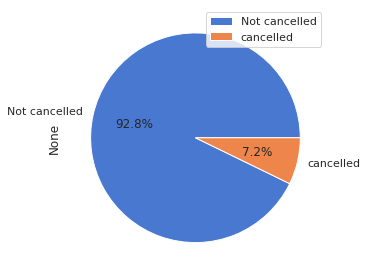

In [127]:
df.groupby(df.Car_Cancellation).size().plot(kind='pie', legend=True, autopct='%1.1f%%', labels = ['Not cancelled', 'cancelled'])
plt.tight_layout()

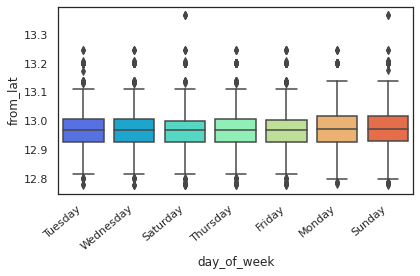

In [66]:
ax = sns.boxplot(x="day_of_week", y="from_lat", data=df,palette='rainbow')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

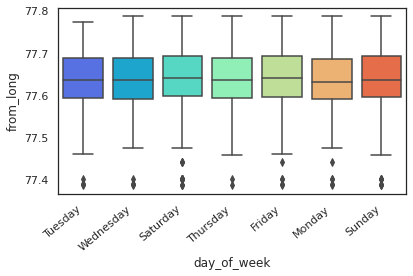

In [128]:
ax = sns.boxplot(x="day_of_week", y="from_long", data=df,palette='rainbow')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

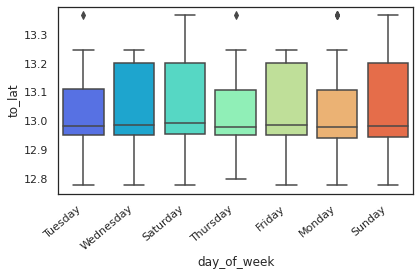

In [129]:
ax = sns.boxplot(x="day_of_week", y="to_lat", data=df,palette='rainbow')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

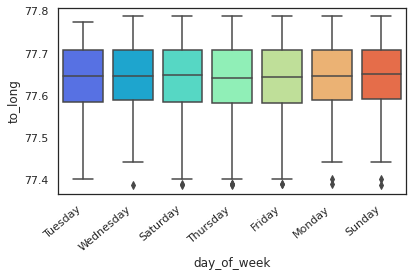

In [130]:
ax = sns.boxplot(x="day_of_week", y="to_long", data=df,palette='rainbow')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

In [131]:
df.corr()

,id,user_id,vehicle_model_id,package_id,from_area_id,to_area_id,from_city_id,to_city_id,online_booking,mobile_site_booking,from_lat,from_long,to_lat,to_long,Car_Cancellation
id,1.000000,0.595899,0.056554,0.433360,0.023031,0.026940,0.225908,-0.028117,0.106483,0.088570,0.045256,0.031744,0.031378,0.033955,0.134326
user_id,0.595899,1.000000,0.061292,0.240933,0.018645,0.008703,0.065497,-0.035831,0.096956,0.054116,0.052895,0.006649,0.052065,0.033748,0.102789
vehicle_model_id,0.056554,0.061292,1.000000,0.045967,-0.023267,-0.037043,-0.042479,0.001020,0.015371,-0.006961,0.057314,0.022373,0.058760,0.049285,-0.045244
package_id,0.433360,0.240933,0.045967,1.000000,-0.006633,NaN,NaN,NaN,-0.022390,-0.029405,-0.032442,0.026772,NaN,NaN,0.071583
from_area_id,0.023031,0.018645,-0.023267,-0.006633,1.000000,0.007327,0.020152,0.013729,0.015911,-0.010490,-0.110597,-0.095218,0.007955,0.007227,0.011357
to_area_id,0.026940,0.008703,-0.037043,NaN,0.007327,1.000000,NaN,NaN,0.004139,-0.014738,0.042631,0.024901,-0.267853,-0.274238,0.066088
from_city_id,0.225908,0.065497,-0.042479,NaN,0.020152,NaN,1.000000,0.000166,-0.088069,0.013358,-0.030439,-0.017189,NaN,NaN,0.024755
to_city_id,-0.028117,-0.035831,0.001020,NaN,0.013729,NaN,0.000166,1.000000,-0.031759,0.050449,-0.040576,-0.006810,NaN,NaN,-0.007882
online_booking,0.106483,0.096956,0.015371,-0.022390,0.015911,0.004139,-0.088069,-0.031759,1.000000,-0.156546,0.043011,0.070559,0.062623,0.016946,0.149476
mobile_site_booking,0.088570,0.054116,-0.006961,-0.029405,-0.010490,-0.014738,0.013358,0.050449,-0.156546,1.000000,0.035396,0.003411,-0.005901,0.012703,0.067204


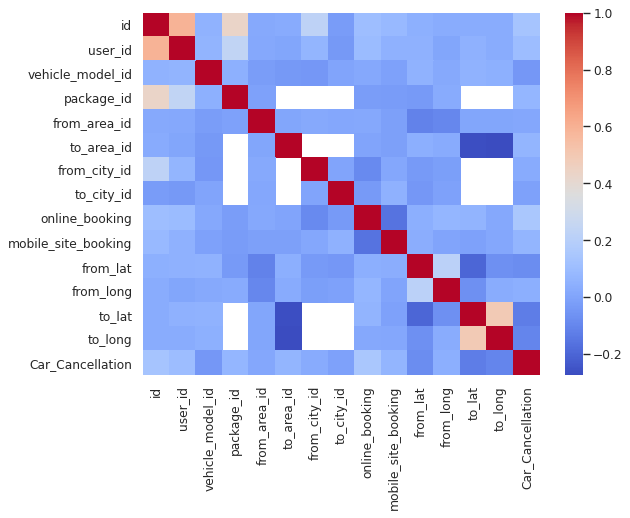

In [132]:
plt.figure(figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
sns.heatmap(df.corr(),cmap='coolwarm')

In [142]:
# number_of_bookings = df.pivot("from_lat", "from_long")
# ax = sns.heatmap(number_of_bookings)

sns.heatmap(df['from_lat'], df['from_long'], annot=True, fmt="d")
sns.scatterplot(x = 'from_lat', y = 'from_long', data=df, hue=)

IndexError: Inconsistent shape between the condition and the input (got (43431, 1) and (43431,))

In [133]:
df['month'] = df.from_date.dt.month

In [134]:
df.month.unique()

array([ 1,  2,  3,  5,  4,  6,  7,  8,  9, 10, 11, 12])

In [135]:
df['month'] = df.month.replace([1, 2, 3, 5, 4, 6, 7, 8, 9, 10, 11, 12], ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])

In [136]:
df.head()

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,...,online_booking,mobile_site_booking,booking_created,from_lat,from_long,to_lat,to_long,Car_Cancellation,day_of_week,month
0,132512,22177,28,NaN,None,83.0,448.0,NaN,NaN,2013-01-01 02:00:00,...,0,0,2013-01-01 01:39:00,12.924150,77.672290,12.927320,77.635750,0,Tuesday,January
1,132513,21413,12,NaN,None,1010.0,540.0,NaN,NaN,2013-01-01 09:00:00,...,0,0,2013-01-01 02:25:00,12.966910,77.749350,12.927680,77.626640,0,Tuesday,January
2,132514,22178,12,NaN,None,1301.0,1034.0,NaN,NaN,2013-01-01 03:30:00,...,0,0,2013-01-01 03:08:00,12.937222,77.626915,13.047926,77.597766,0,Tuesday,January
3,132515,13034,12,NaN,None,768.0,398.0,NaN,NaN,2013-01-01 05:45:00,...,0,0,2013-01-01 04:39:00,12.989990,77.553320,12.971430,77.639140,0,Tuesday,January
4,132517,22180,12,NaN,None,1365.0,849.0,NaN,NaN,2013-01-01 09:00:00,...,0,0,2013-01-01 07:53:00,12.845653,77.677925,12.954340,77.600720,0,Tuesday,January


In [143]:
df['year_of_booking'] = df.booking_created.dt.year

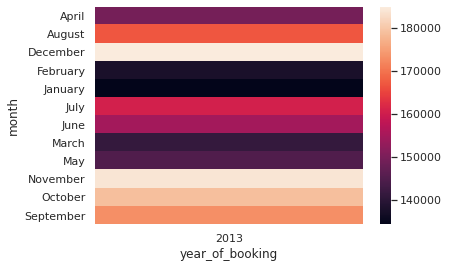

In [144]:
sns.heatmap(df.pivot_table(values='id',index='month',columns='year_of_booking'))

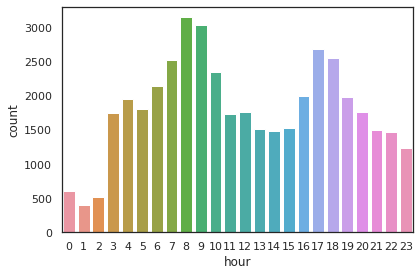

In [145]:
plt.figure(figsize=(6,4))
df['hour'] = df['from_date'].dt.hour
sns.countplot(df['hour'])
plt.tight_layout()

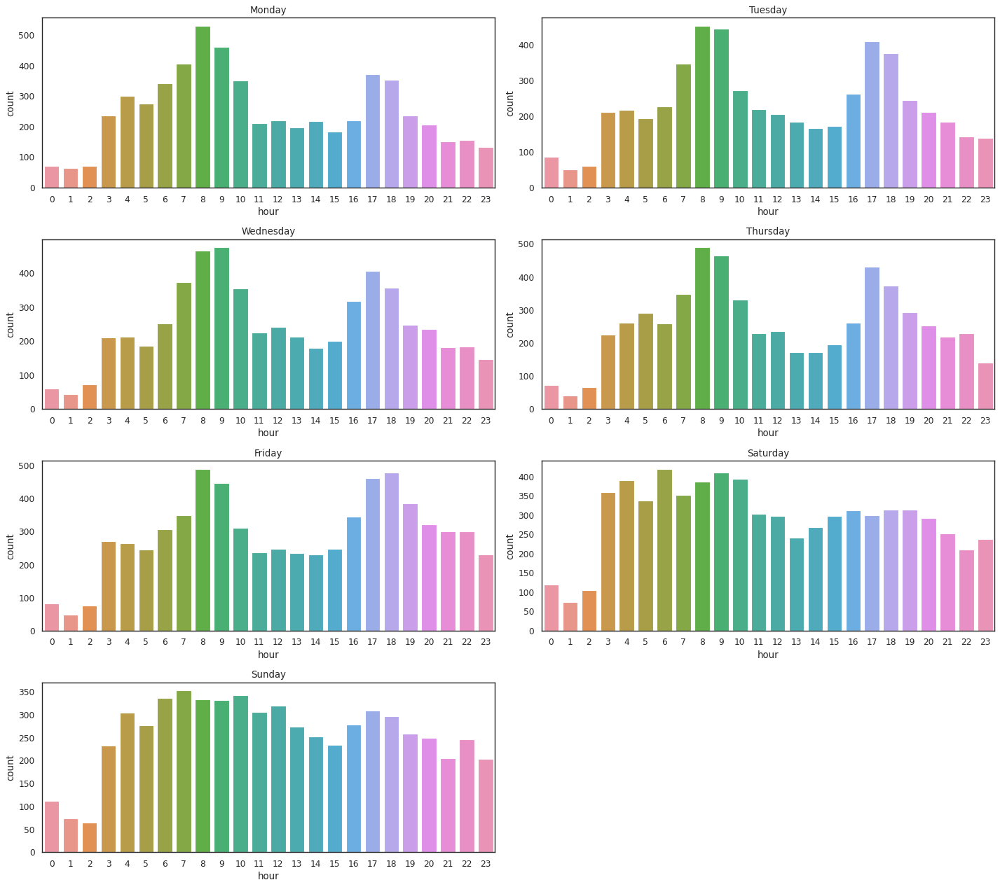

In [146]:
fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')

monday = pd.DataFrame(df[df['day_of_week']  == "Monday"])
plt.subplot(4, 2, 1)
sns.countplot(monday.hour)
plt.title("Monday")

tuesday = pd.DataFrame(df[df['day_of_week']  == "Tuesday"])
plt.subplot(4, 2, 2)
sns.countplot(tuesday.hour)
plt.title("Tuesday")


wednesday = pd.DataFrame(df[df['day_of_week']  == "Wednesday"])
plt.subplot(4, 2, 3)
sns.countplot(wednesday.hour)
plt.title("Wednesday")


thursday = pd.DataFrame(df[df['day_of_week']  == "Thursday"])
plt.subplot(4, 2, 4)
sns.countplot(thursday.hour)
plt.title("Thursday")


friday = pd.DataFrame(df[df['day_of_week']  == "Friday"])
plt.subplot(4, 2, 5)
sns.countplot(friday.hour)
plt.title("Friday")


saturday = pd.DataFrame(df[df['day_of_week']  == "Saturday"])
plt.subplot(4, 2, 6)
sns.countplot(saturday.hour)
plt.title("Saturday")

sunday = pd.DataFrame(df[df['day_of_week']  == "Sunday"])
plt.subplot(4, 2, 7)
sns.countplot(sunday.hour)
plt.title("Sunday")

plt.tight_layout()

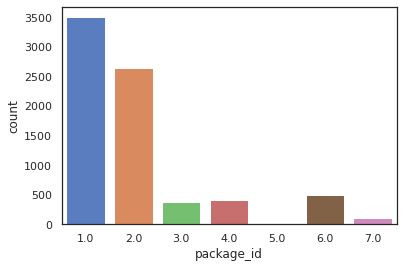

In [147]:
sns.countplot(df.package_id)

In [149]:
df['from_lat'].isnull().sum()

93

In [150]:
df['from_long'].isnull().sum()

93

In [151]:
df['to_lat'].isnull().sum()

9138

In [152]:
df['to_long'].isnull().sum()

9138

**Since only 0.21% of the data is missing in the from_lat and from_long columns, let's drop the rows containing missing valus instead of imputing it.**

In [153]:
df_loc = df.dropna(subset=['from_lat', 'from_long'], axis = 0, inplace=True)

**Removing the missing from_lat and from_long values from all seven days of a week**

In [154]:
mon_loc = monday.dropna(subset=['from_lat', 'from_long'])
tue_loc = tuesday.dropna(subset=['from_lat', 'from_long'])
wed_loc = wednesday.dropna(subset=['from_lat', 'from_long'])
thu_loc = thursday.dropna(subset=['from_lat', 'from_long'])
fri_loc = friday.dropna(subset=['from_lat', 'from_long'])
sat_loc = saturday.dropna(subset=['from_lat', 'from_long'])
sun_loc = sunday.dropna(subset=['from_lat', 'from_long'])

## The below maps visualises the number of pickups for the given latitude and longitude 
### Note:
1. The numbes on the markers represents the number of pickup requests in that geographical area.
2. Orange, yellow and green color of the markers represents more, medium and less number of pickups respectively.

## Geospatial distribution of pickups for monday

In [155]:
monday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12) # enter the lat long
marker_cluster = MarkerCluster() # define marker cluster
marker_cluster.add_to(monday_map) # add marker cluster to the map

for index, rows in mon_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

monday_map

## Geospatial distribution of pickups for tuesday

In [156]:
tuesday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12)
marker_cluster = MarkerCluster()
marker_cluster.add_to(tuesday_map)

for index, rows in tue_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

tuesday_map

## Geospatial distribution of pickups for wednesday

In [157]:
wednesday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12)
marker_cluster = MarkerCluster()
marker_cluster.add_to(wednesday_map)

for index, rows in wed_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

wednesday_map

## Geospatial distribution of pickups for thursday

In [158]:
thursday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12)
marker_cluster = MarkerCluster()
marker_cluster.add_to(thursday_map)

for index, rows in thu_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

thursday_map

## Geospatial distribution of pickups for friday

In [159]:
friday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12)
marker_cluster = MarkerCluster()
marker_cluster.add_to(friday_map)

for index, rows in fri_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

friday_map

## Geospatial distribution of pickups for saturday

In [160]:
saturday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12)
marker_cluster = MarkerCluster()
marker_cluster.add_to(saturday_map)

for index, rows in sat_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

saturday_map

## Geospatial distribution of pickups for sunday

In [161]:
sunday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12)
marker_cluster = MarkerCluster()
marker_cluster.add_to(sunday_map)

for index, rows in sun_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

sunday_map

## Conclusions:
1. Despite of booking and cancelling, most of the people take a cab during weekends to travel from one location to another
2. The demand of the cab is high during the office commute (to and fro), and least during the midnight (1 AM to 3 AM)
3. Frequency of point to point- type of travel, and the least is rental.

Therefore, the utilization rate of the cabs can be maximised by:
1. Increasing the fare during office commute period, at areas having maximum number of pickups.
2. Getting more cabs to do point to point and less on rental travel type.